In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os 
import sys

sys.path.append('../figuras')
sys.path.append('../comparison')
sys.path.append('../dCor')
sys.path.append('../MIC')
sys.path.append('../BCI')

from img_comparison import compare_images

from scipy.spatial import distance
from minepy import MINE
import dcor 

from scipy.stats import pearsonr

In [2]:
def get_all_comp(img_1, img_2, method = 'full'):

    comp = compare_images(img_1, img_2)

    # dcor
    dcorr_func = lambda x, y: dcor.distance_correlation(x, y)
    dcor_res = comp.compare_images(function=dcorr_func, comparison_method= method)

    dcov_func = lambda x, y: dcor.distance_covariance(x, y)
    dcov_res = comp.compare_images(function=dcov_func, comparison_method= method)

    # mic
    def mic(x, y):
        m = MINE(alpha=0.6, c=15, est="mic_e")
        m.compute_score(x, y)
        return m.mic()
    
    mic_e = lambda x, y:  mic(x, y)
    mic_e_res = comp.compare_images(function=mic_e, comparison_method= method)

    # tic
    def tic(x, y):
        m = MINE(alpha=0.6, c=15, est="mic_e")
        m.compute_score(x, y)
        return m.tic()
    tic_e = lambda x, y:  tic(x, y)
    tic_e_res = comp.compare_images(function=tic_e, comparison_method= method)


    # corr
    corr = lambda x, y: pearsonr(x, y)[0]
    corr_res = comp.compare_images(function=corr, comparison_method= method)

    return dcor_res,dcov_res , mic_e_res, tic_e_res, corr_res


    

In [3]:
images_df_full = pd.DataFrame(columns=['n_image', 'lambda','dcor', 'dcov' ,  'mic', 'tic', 'pearson'])

images_df_hist = pd.DataFrame(columns=['n_image', 'lambda','dcor', 'dcov' ,  'mic', 'tic', 'pearson'])


In [4]:
from box_cox_img import BoxCoxImg
import matplotlib.pyplot as plt

# from tqdm import tqdm

# for i in tqdm(range(1, 25)):
    # img_path = f'../figuras/img/{i}.png'
    
    # BCI = BoxCoxImg(img_path)
    # plt.imshow(BCI.bw_img, cmap='gray')
    # plt.show()

    # for lmbda in np.linspace(-5, 5, 31):

    #     #full
    #     full_bc = BCI.transform(method='full', lam= lmbda)
    #     # plt.imshow(full_bc, cmap='gray')
    #     # plt.show()

    #     plt.show()
    #     print(f'lambda={lmbda}')
    #     dcor_full_full, dcov_full_full ,mic_full_full, tic_full_full, corr_full_full = get_all_comp(BCI.bw_img, full_bc, method='full')
    #     print(f'full bc, full comp: dcor={dcor_full_full}, dcov={dcov_full_full}, mic={mic_full_full}, tic={tic_full_full}, corr={corr_full_full}')

    #     dcor_hist_full, dcov_hist_full ,mic_hist_full, tic_hist_full, corr_hist_full = get_all_comp(BCI.bw_img, full_bc, method='hist')
    #     print(f'full bc, hist comp: dcor={dcor_hist_full}, dcov={dcov_hist_full}, mic={mic_hist_full}, tic={tic_hist_full}, corr={corr_hist_full}')

    #     images_df_full = pd.concat([images_df_full, pd.DataFrame([[i, lmbda, dcor_full_full, dcov_full_full, mic_full_full, tic_full_full, corr_full_full]]
    #                                                             , columns=images_df_full.columns)], ignore_index=True)
                                                                


    #     images_df_hist = pd.concat([images_df_hist, pd.DataFrame([[i, lmbda, dcor_hist_full, dcov_hist_full, mic_hist_full, tic_hist_full, corr_hist_full]]
    #                                                             , columns=images_df_hist.columns)], ignore_index=True)
        
    #     break
    # images_df_full.to_csv('./images_lam_df_full.csv')
    # images_df_hist.to_csv('./images_lam_df_hist.csv')
    # break


# images_df_full.to_csv('./images_lam_df_full_end.csv')
# images_df_hist.to_csv('./images_lam_df_hist_end.csv')



In [5]:

images_df_full = pd.read_csv('./images_lam_df_full_end.csv', index_col=0)
images_df_hist = pd.read_csv('./images_lam_df_hist_end.csv', index_col=0)

In [6]:
images_df_hist

,n_image,lambda,dcor,dcov,mic,tic,pearson
0,1,-5.000000,0.058016,107.205377,0.033981,0.664905,-0.038282
1,1,-4.666667,0.058016,107.205377,0.033981,0.664905,-0.038282
2,1,-4.333333,0.058016,107.205377,0.033981,0.664905,-0.038282
3,1,-4.000000,0.058016,107.205377,0.033981,0.664905,-0.038282
4,1,-3.666667,0.058016,107.205377,0.033981,0.664905,-0.038282
...,...,...,...,...,...,...,...
739,24,3.666667,0.220731,288.111207,0.194582,5.122427,-0.020150
740,24,4.000000,0.214594,281.996928,0.184978,5.226130,-0.024489
741,24,4.333333,0.202836,269.569480,0.161127,4.519944,-0.026880
742,24,4.666667,0.193732,262.055494,0.147049,4.284289,-0.026711


In [7]:
images_df_full

,n_image,lambda,dcor,dcov,mic,tic,pearson
0,1,-5.000000,0.000000,0.000000,0.020393,186.260475,0.121263
1,1,-4.666667,0.000000,0.000000,0.020393,186.260475,0.121263
2,1,-4.333333,0.000000,0.000000,0.020393,186.260475,0.121263
3,1,-4.000000,0.000000,0.000000,0.020393,186.260475,0.121263
4,1,-3.666667,0.000000,0.000000,0.020393,186.260475,0.121263
...,...,...,...,...,...,...,...
739,24,3.666667,0.886895,0.113547,1.000000,13345.603662,0.872312
740,24,4.000000,0.871049,0.110988,1.000000,13345.606867,0.858348
741,24,4.333333,0.856681,0.108709,1.000000,13345.596282,0.845983
742,24,4.666667,0.843744,0.106678,1.000000,13345.565474,0.835078


In [8]:
images_df_hist.n_image.unique()

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24])

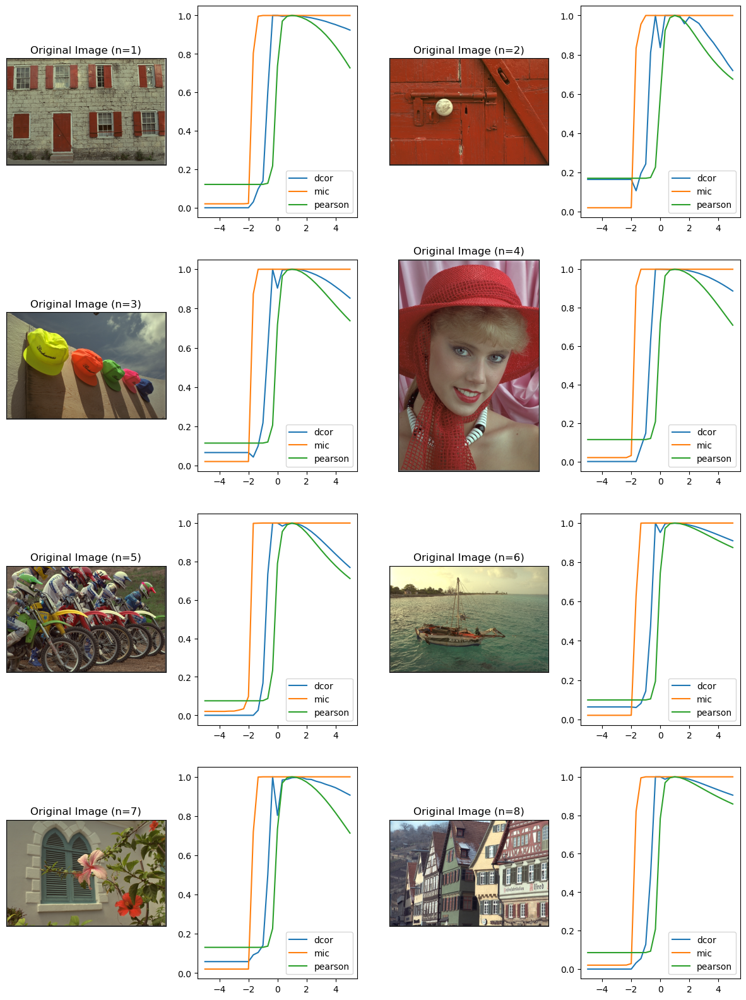

In [9]:
# plot lambda vs dcor, mic, pearson in df
ims = range(1, 23, 2)
fig, ax = plt.subplots(4, 4, figsize=(15, 20))
j = 0

for n_im in range(1, 9, 2):

    df_im = images_df_full[images_df_full['n_image'] == n_im]
    
    img_path = f'../figuras/img/{n_im}.png'
    img = plt.imread(img_path)
    ax[j, 0].imshow(img)
    ax[j, 0].set_title(f'Original Image (n={n_im})')
    #remove grid and axes
    ax[j, 0].grid(False)
    ax[j, 0].set_xticks([])
    ax[j, 0].set_yticks([])


    ax[j, 1].plot(df_im['lambda'], df_im['dcor'].clip(0,1), label='dcor')
    ax[j, 1].plot(df_im['lambda'], df_im['mic'], label='mic')
    ax[j, 1].plot(df_im['lambda'], df_im['pearson'], label='pearson')
    # ax[j, 1].set_xlabel('lambda')
    # ax[j, 1].set_ylabel('correlation')
    # ax[j, 1].set_title('Full Comparison')
    ax[j, 1].legend()

    n_im += 1

    df_im = images_df_full[images_df_full['n_image'] == n_im]
    
    img_path = f'../figuras/img/{n_im}.png'
    img = plt.imread(img_path)
    ax[j, 2].imshow(img)
    ax[j, 2].set_title(f'Original Image (n={n_im})')
    #remove grid and axes
    ax[j, 2].grid(False)
    ax[j, 2].set_xticks([])
    ax[j, 2].set_yticks([])


    ax[j, 3].plot(df_im['lambda'], df_im['dcor'].clip(0,1), label='dcor')
    ax[j, 3].plot(df_im['lambda'], df_im['mic'], label='mic')
    ax[j, 3].plot(df_im['lambda'], df_im['pearson'], label='pearson')
    # ax[j, 3].set_xlabel('lambda')
    # ax[j, 3].set_ylabel('correlation')
    # ax[j, 3].set_title('Full Comparison')
    ax[j, 3].legend()

    j += 1

plt.savefig('./figs/full_comp_1.png', bbox_inches='tight', pad_inches=0)
plt.show()


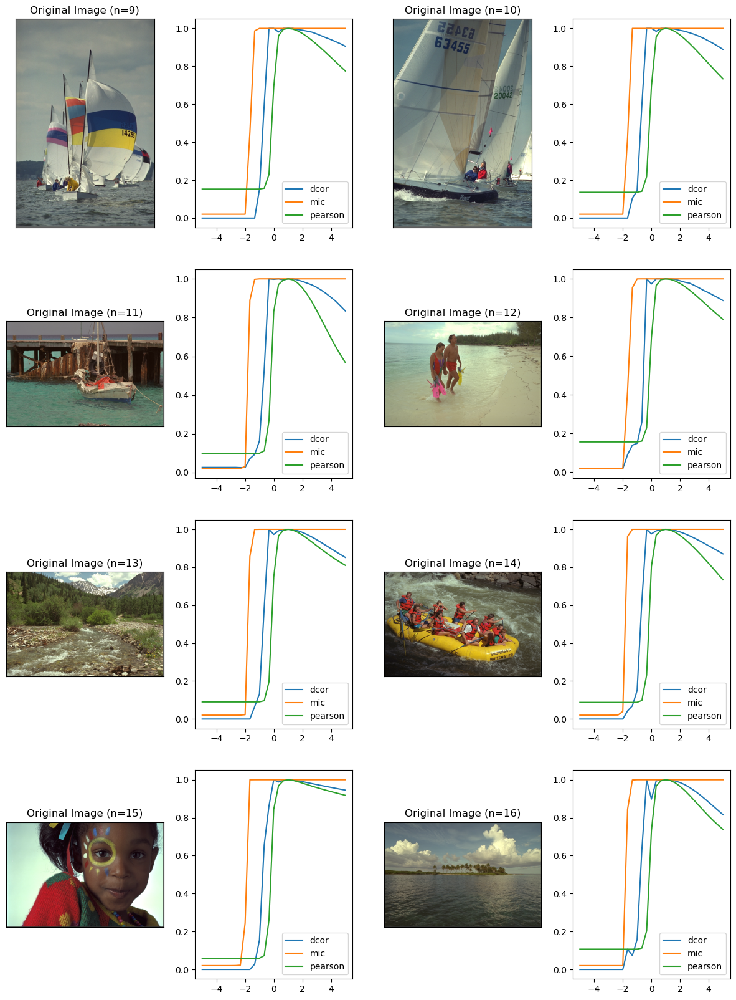

In [10]:
# plot lambda vs dcor, mic, pearson in df
ims = range(1, 23, 2)
fig, ax = plt.subplots(4, 4, figsize=(15, 20))
j = 0

for n_im in range(9, 17, 2):

    df_im = images_df_full[images_df_full['n_image'] == n_im]
    
    img_path = f'../figuras/img/{n_im}.png'
    img = plt.imread(img_path)
    ax[j, 0].imshow(img)
    ax[j, 0].set_title(f'Original Image (n={n_im})')
    #remove grid and axes
    ax[j, 0].grid(False)
    ax[j, 0].set_xticks([])
    ax[j, 0].set_yticks([])


    ax[j, 1].plot(df_im['lambda'], df_im['dcor'].clip(0,1), label='dcor')
    ax[j, 1].plot(df_im['lambda'], df_im['mic'], label='mic')
    ax[j, 1].plot(df_im['lambda'], df_im['pearson'], label='pearson')
    # ax[j, 1].set_xlabel('lambda')
    # ax[j, 1].set_ylabel('correlation')
    # ax[j, 1].set_title('Full Comparison')
    ax[j, 1].legend()

    n_im += 1

    df_im = images_df_full[images_df_full['n_image'] == n_im]
    
    img_path = f'../figuras/img/{n_im}.png'
    img = plt.imread(img_path)
    ax[j, 2].imshow(img)
    ax[j, 2].set_title(f'Original Image (n={n_im})')
    #remove grid and axes
    ax[j, 2].grid(False)
    ax[j, 2].set_xticks([])
    ax[j, 2].set_yticks([])


    ax[j, 3].plot(df_im['lambda'], df_im['dcor'].clip(0,1), label='dcor')
    ax[j, 3].plot(df_im['lambda'], df_im['mic'], label='mic')
    ax[j, 3].plot(df_im['lambda'], df_im['pearson'], label='pearson')
    # ax[j, 3].set_xlabel('lambda')
    # ax[j, 3].set_ylabel('correlation')
    # ax[j, 3].set_title('Full Comparison')
    ax[j, 3].legend()

    j += 1

plt.savefig('./figs/full_comp_2.png', bbox_inches='tight', pad_inches=0)
plt.show()


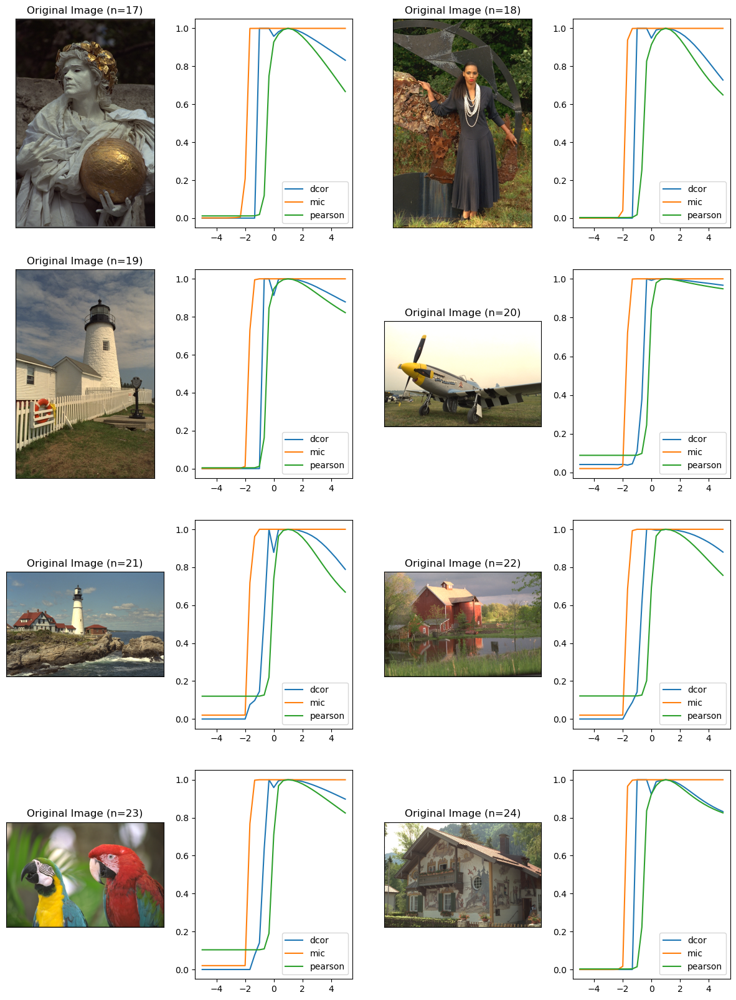

In [11]:
# plot lambda vs dcor, mic, pearson in df
ims = range(1, 23, 2)
fig, ax = plt.subplots(4, 4, figsize=(15, 20))
j = 0

for n_im in range(17, 25, 2):

    df_im = images_df_full[images_df_full['n_image'] == n_im]
    
    img_path = f'../figuras/img/{n_im}.png'
    img = plt.imread(img_path)
    ax[j, 0].imshow(img)
    ax[j, 0].set_title(f'Original Image (n={n_im})')
    #remove grid and axes
    ax[j, 0].grid(False)
    ax[j, 0].set_xticks([])
    ax[j, 0].set_yticks([])


    ax[j, 1].plot(df_im['lambda'], df_im['dcor'].clip(0,1), label='dcor')
    ax[j, 1].plot(df_im['lambda'], df_im['mic'], label='mic')
    ax[j, 1].plot(df_im['lambda'], df_im['pearson'], label='pearson')
    # ax[j, 1].set_xlabel('lambda')
    # ax[j, 1].set_ylabel('correlation')
    # ax[j, 1].set_title('Full Comparison')
    ax[j, 1].legend()

    n_im += 1

    df_im = images_df_full[images_df_full['n_image'] == n_im]
    
    img_path = f'../figuras/img/{n_im}.png'
    img = plt.imread(img_path)
    ax[j, 2].imshow(img)
    ax[j, 2].set_title(f'Original Image (n={n_im})')
    #remove grid and axes
    ax[j, 2].grid(False)
    ax[j, 2].set_xticks([])
    ax[j, 2].set_yticks([])


    ax[j, 3].plot(df_im['lambda'], df_im['dcor'].clip(0,1), label='dcor')
    ax[j, 3].plot(df_im['lambda'], df_im['mic'], label='mic')
    ax[j, 3].plot(df_im['lambda'], df_im['pearson'], label='pearson')
    # ax[j, 3].set_xlabel('lambda')
    # ax[j, 3].set_ylabel('correlation')
    # ax[j, 3].set_title('Full Comparison')
    ax[j, 3].legend()

    j += 1

plt.savefig('./figs/full_comp_3.png', bbox_inches='tight', pad_inches=0)
plt.show()


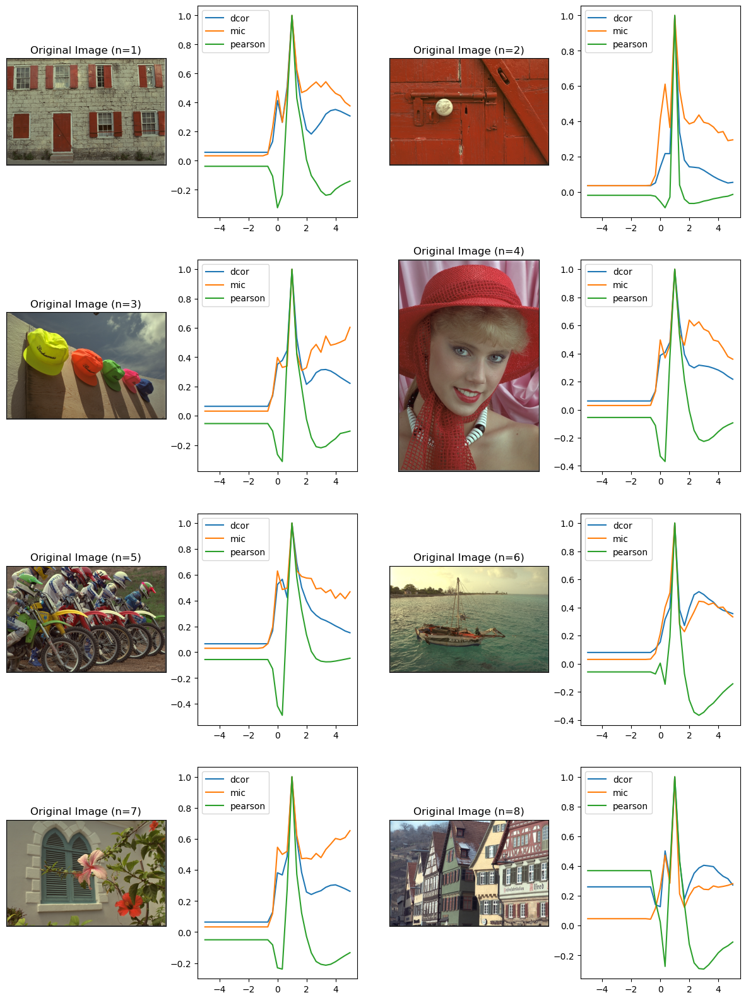

In [12]:
# plot lambda vs dcor, mic, pearson in df
ims = range(1, 23, 2)
fig, ax = plt.subplots(4, 4, figsize=(15, 20))
j = 0

for n_im in range(1, 9, 2):

    df_im = images_df_hist[images_df_hist['n_image'] == n_im]
    
    img_path = f'../figuras/img/{n_im}.png'
    img = plt.imread(img_path)
    ax[j, 0].imshow(img)
    ax[j, 0].set_title(f'Original Image (n={n_im})')
    #remove grid and axes
    ax[j, 0].grid(False)
    ax[j, 0].set_xticks([])
    ax[j, 0].set_yticks([])


    ax[j, 1].plot(df_im['lambda'], df_im['dcor'].clip(0,1), label='dcor')
    ax[j, 1].plot(df_im['lambda'], df_im['mic'], label='mic')
    ax[j, 1].plot(df_im['lambda'], df_im['pearson'], label='pearson')
    # ax[j, 1].set_xlabel('lambda')
    # ax[j, 1].set_ylabel('correlation')
    # ax[j, 1].set_title('Full Comparison')
    ax[j, 1].legend()

    n_im += 1

    df_im = images_df_hist[images_df_hist['n_image'] == n_im]
    
    img_path = f'../figuras/img/{n_im}.png'
    img = plt.imread(img_path)
    ax[j, 2].imshow(img)
    ax[j, 2].set_title(f'Original Image (n={n_im})')
    #remove grid and axes
    ax[j, 2].grid(False)
    ax[j, 2].set_xticks([])
    ax[j, 2].set_yticks([])


    ax[j, 3].plot(df_im['lambda'], df_im['dcor'].clip(0,1), label='dcor')
    ax[j, 3].plot(df_im['lambda'], df_im['mic'], label='mic')
    ax[j, 3].plot(df_im['lambda'], df_im['pearson'], label='pearson')
    # ax[j, 3].set_xlabel('lambda')
    # ax[j, 3].set_ylabel('correlation')
    # ax[j, 3].set_title('Full Comparison')
    ax[j, 3].legend()

    j += 1

plt.savefig('./figs/hist_comp_1.png')
plt.show()


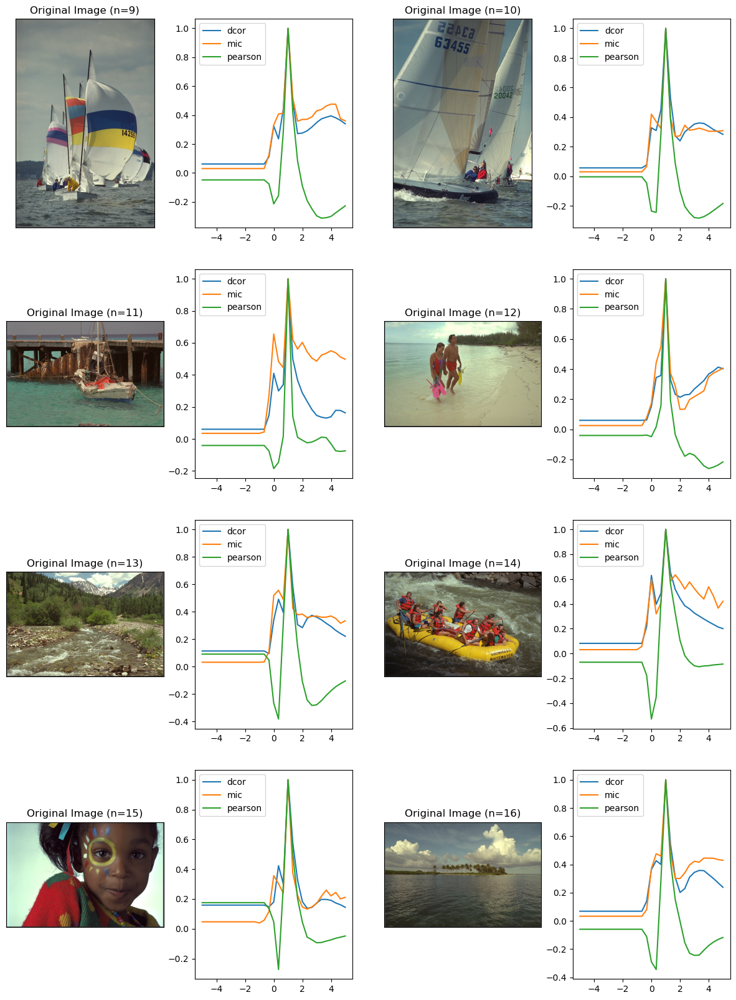

In [13]:
# plot lambda vs dcor, mic, pearson in df
ims = range(1, 23, 2)
fig, ax = plt.subplots(4, 4, figsize=(15, 20))
j = 0

for n_im in range(9, 17, 2):

    df_im = images_df_hist[images_df_hist['n_image'] == n_im]
    
    img_path = f'../figuras/img/{n_im}.png'
    img = plt.imread(img_path)
    ax[j, 0].imshow(img)
    ax[j, 0].set_title(f'Original Image (n={n_im})')
    #remove grid and axes
    ax[j, 0].grid(False)
    ax[j, 0].set_xticks([])
    ax[j, 0].set_yticks([])


    ax[j, 1].plot(df_im['lambda'], df_im['dcor'].clip(0,1), label='dcor')
    ax[j, 1].plot(df_im['lambda'], df_im['mic'], label='mic')
    ax[j, 1].plot(df_im['lambda'], df_im['pearson'], label='pearson')
    # ax[j, 1].set_xlabel('lambda')
    # ax[j, 1].set_ylabel('correlation')
    # ax[j, 1].set_title('Full Comparison')
    ax[j, 1].legend()

    n_im += 1

    df_im = images_df_hist[images_df_hist['n_image'] == n_im]
    
    img_path = f'../figuras/img/{n_im}.png'
    img = plt.imread(img_path)
    ax[j, 2].imshow(img)
    ax[j, 2].set_title(f'Original Image (n={n_im})')
    #remove grid and axes
    ax[j, 2].grid(False)
    ax[j, 2].set_xticks([])
    ax[j, 2].set_yticks([])


    ax[j, 3].plot(df_im['lambda'], df_im['dcor'].clip(0,1), label='dcor')
    ax[j, 3].plot(df_im['lambda'], df_im['mic'], label='mic')
    ax[j, 3].plot(df_im['lambda'], df_im['pearson'], label='pearson')
    # ax[j, 3].set_xlabel('lambda')
    # ax[j, 3].set_ylabel('correlation')
    # ax[j, 3].set_title('Full Comparison')
    ax[j, 3].legend()

    j += 1

plt.savefig('./figs/hist_comp_2.png')
plt.show()


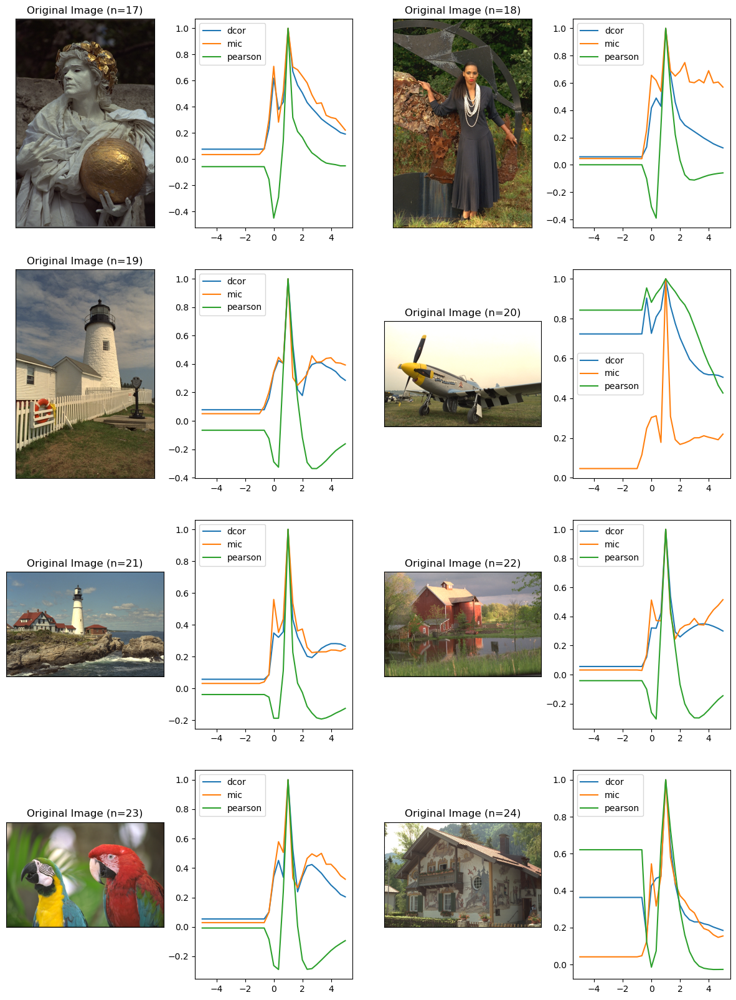

In [14]:
# plot lambda vs dcor, mic, pearson in df
ims = range(1, 23, 2)
fig, ax = plt.subplots(4, 4, figsize=(15, 20))
j = 0

for n_im in range(17, 25, 2):

    df_im = images_df_hist[images_df_hist['n_image'] == n_im]
    
    img_path = f'../figuras/img/{n_im}.png'
    img = plt.imread(img_path)
    ax[j, 0].imshow(img)
    ax[j, 0].set_title(f'Original Image (n={n_im})')
    #remove grid and axes
    ax[j, 0].grid(False)
    ax[j, 0].set_xticks([])
    ax[j, 0].set_yticks([])


    ax[j, 1].plot(df_im['lambda'], df_im['dcor'].clip(0,1), label='dcor')
    ax[j, 1].plot(df_im['lambda'], df_im['mic'], label='mic')
    ax[j, 1].plot(df_im['lambda'], df_im['pearson'], label='pearson')
    # ax[j, 1].set_xlabel('lambda')
    # ax[j, 1].set_ylabel('correlation')
    # ax[j, 1].set_title('Full Comparison')
    ax[j, 1].legend()

    n_im += 1

    df_im = images_df_hist[images_df_hist['n_image'] == n_im]
    
    img_path = f'../figuras/img/{n_im}.png'
    img = plt.imread(img_path)
    ax[j, 2].imshow(img)
    ax[j, 2].set_title(f'Original Image (n={n_im})')
    #remove grid and axes
    ax[j, 2].grid(False)
    ax[j, 2].set_xticks([])
    ax[j, 2].set_yticks([])


    ax[j, 3].plot(df_im['lambda'], df_im['dcor'].clip(0,1), label='dcor')
    ax[j, 3].plot(df_im['lambda'], df_im['mic'], label='mic')
    ax[j, 3].plot(df_im['lambda'], df_im['pearson'], label='pearson')
    # ax[j, 3].set_xlabel('lambda')
    # ax[j, 3].set_ylabel('correlation')
    # ax[j, 3].set_title('Full Comparison')
    ax[j, 3].legend()

    j += 1

plt.savefig('./figs/hist_comp_3.png')
plt.show()


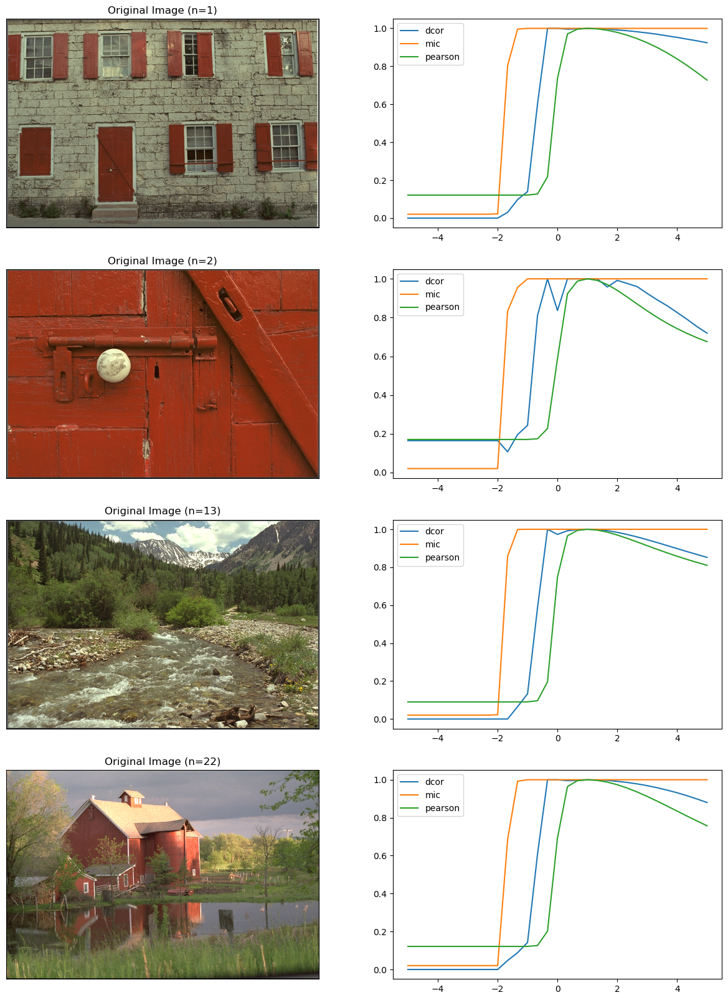

In [15]:
# plot lambda vs dcor, mic, pearson in df
ims = range(1, 23, 2)
fig, ax = plt.subplots(4, 2, figsize=(15, 20))
j = 0

for n_im in [1, 2, 13, 22]:

    df_im = images_df_full[images_df_full['n_image'] == n_im]
    
    img_path = f'../figuras/img/{n_im}.png'
    img = plt.imread(img_path)
    ax[j, 0].imshow(img)
    ax[j, 0].set_title(f'Original Image (n={n_im})')
    #remove grid and axes
    ax[j, 0].grid(False)
    ax[j, 0].set_xticks([])
    ax[j, 0].set_yticks([])


    ax[j, 1].plot(df_im['lambda'], df_im['dcor'].clip(0,1), label='dcor')
    ax[j, 1].plot(df_im['lambda'], df_im['mic'], label='mic')
    ax[j, 1].plot(df_im['lambda'], df_im['pearson'], label='pearson')
    # ax[j, 1].set_xlabel('lambda')
    # ax[j, 1].set_ylabel('correlation')
    # ax[j, 1].set_title('Full Comparison')
    ax[j, 1].legend()
    j += 1

plt.savefig('./figs/lam_v_com_all_img.png', bbox_inches='tight', pad_inches=0)
plt.show()


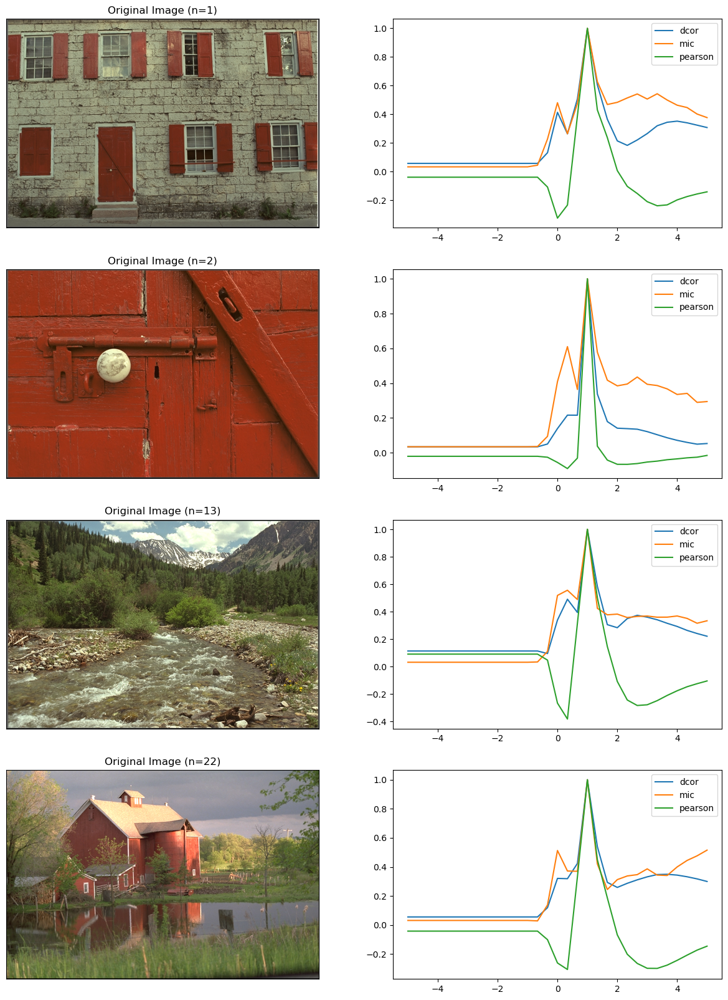

In [16]:
# plot lambda vs dcor, mic, pearson in df
ims = range(1, 23, 2)
fig, ax = plt.subplots(4, 2, figsize=(15, 20))
j = 0

for n_im in [1, 2, 13, 22]:

    df_im = images_df_hist[images_df_hist['n_image'] == n_im]
    
    img_path = f'../figuras/img/{n_im}.png'
    img = plt.imread(img_path)
    ax[j, 0].imshow(img)
    ax[j, 0].set_title(f'Original Image (n={n_im})')
    #remove grid and axes
    ax[j, 0].grid(False)
    ax[j, 0].set_xticks([])
    ax[j, 0].set_yticks([])


    ax[j, 1].plot(df_im['lambda'], df_im['dcor'].clip(0,1), label='dcor')
    ax[j, 1].plot(df_im['lambda'], df_im['mic'], label='mic')
    ax[j, 1].plot(df_im['lambda'], df_im['pearson'], label='pearson')
    # ax[j, 1].set_xlabel('lambda')
    # ax[j, 1].set_ylabel('correlation')
    # ax[j, 1].set_title('Full Comparison')
    ax[j, 1].legend()

    j += 1

plt.savefig('./figs/lam_v_com_all_img_hist.png')
plt.show()
